In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("prakharrastogi534/bean-leaf-dataset")

print("Path to dataset files:", path)

100%|██████████| 172M/172M [00:02<00:00, 79.3MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/prakharrastogi534/bean-leaf-dataset/versions/1


In [2]:
import tensorflow as tf
from tensorflow.keras.applications import NASNetMobile
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.optimizers import Adam, Nadam, RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications import EfficientNetB6
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.metrics import Precision, Recall
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt



In [3]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [4]:
train_dir = f'{path}/train/train'
validation_dir = f'{path}/validation/validation'
test_dir = f'{path}/test/test'


assert os.path.exists(train_dir), "Training directory not found."
assert os.path.exists(validation_dir), "Validation directory not found."
assert os.path.exists(test_dir), "Test directory not found."


In [5]:
import matplotlib.pyplot as plt

def plot_training_history(history, history_fine):
    # Combine histories
    combined_acc = history.history['accuracy'] + history_fine.history['accuracy']
    combined_val_acc = history.history['val_accuracy'] + history_fine.history['val_accuracy']
    combined_loss = history.history['loss'] + history_fine.history['loss']
    combined_val_loss = history.history['val_loss'] + history_fine.history['val_loss']
    min_acc = min(min(combined_acc), min(combined_val_acc)) * 100

    min_acc_tick = int(min_acc - (min_acc % 5))

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(combined_acc, label='Training Accuracy')
    plt.plot(combined_val_acc, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.yticks([i / 100 for i in range(min_acc_tick, 101, 5)])
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(combined_loss, label='Training Loss')
    plt.plot(combined_val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()



In [6]:

def plot_training_history2(history):
    # Combine histories
    combined_acc = history.history['accuracy']
    combined_val_acc = history.history['val_accuracy']
    combined_loss = history.history['loss']
    combined_val_loss = history.history['val_loss']
    min_acc = min(min(combined_acc), min(combined_val_acc)) * 100

    min_acc_tick = int(min_acc - (min_acc % 5))

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(combined_acc, label='Training Accuracy')
    plt.plot(combined_val_acc, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.yticks([i / 100 for i in range(min_acc_tick, 101, 5)])
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(combined_loss, label='Training Loss')
    plt.plot(combined_val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()



In [7]:
def test_model_and_plot(model, test_generator, class_indices, num_samples=5):
    idx_to_class = {v: k for k, v in class_indices.items()}

    x_test, y_test = next(test_generator)
    x_test, y_test = x_test[:num_samples], y_test[:num_samples]

    predictions = model.predict(x_test)
    predicted_classes = np.argmax(predictions, axis=1)
    actual_classes = np.argmax(y_test, axis=1)

    plt.figure(figsize=(15, 5))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(x_test[i])
        plt.axis('off')
        predicted_label = idx_to_class[predicted_classes[i]]
        actual_label = idx_to_class[actual_classes[i]]
        plt.title(f"Pred: {predicted_label}\nActual: {actual_label}", fontsize=10)

    plt.tight_layout()
    plt.show()

In [8]:
with tf.device('/gpu:0'):
    train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=30,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True
    )

    validation_datagen = ImageDataGenerator(rescale=1./255)

    test_datagen = ImageDataGenerator(rescale=1./255)

    train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(224, 224),
        batch_size=64,
        shuffle=True,
        class_mode='categorical'
    )

    validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(224, 224),
        batch_size=32,
        class_mode='categorical'
    )

    test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(224, 224),
        batch_size=32,
        class_mode='categorical'
    )

    base_model = NASNetMobile(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = False


Found 1034 images belonging to 3 classes.
Found 133 images belonging to 3 classes.
Found 128 images belonging to 3 classes.
19993432/19993432 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [9]:
class_counts = {class_name: 0 for class_name in train_generator.class_indices.keys()}

for i in range(len(train_generator)):
    x, y = train_generator[i]
    class_counts.update({class_name: class_counts[class_name] + int(y[:, idx].sum())
                         for class_name, idx in train_generator.class_indices.items()})

for class_name, count in class_counts.items():
    print(f"{class_name}: {count} samples")

angular_leaf_spot: 345 samples
bean_rust: 348 samples
healthy: 341 samples


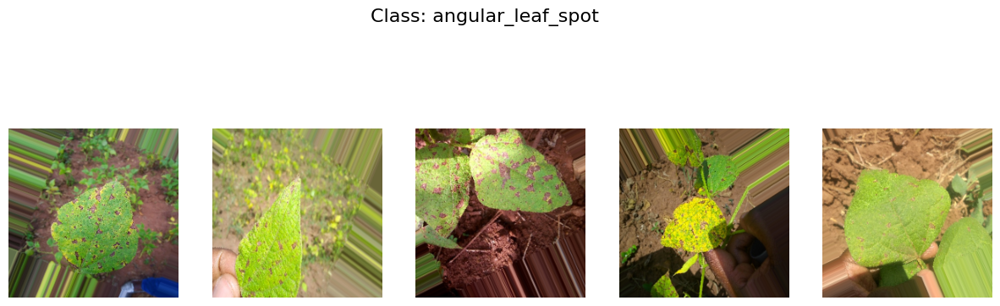

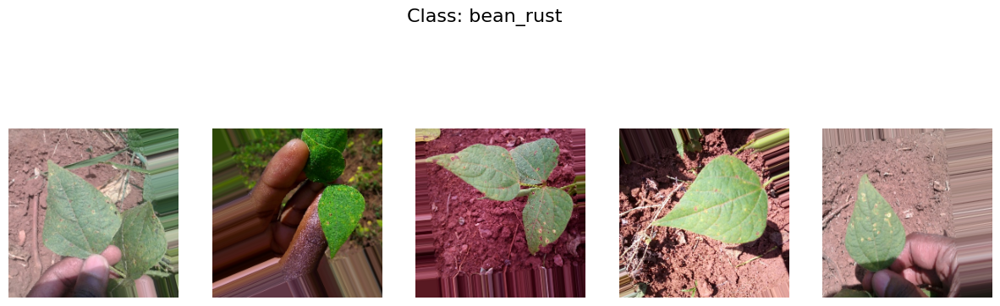

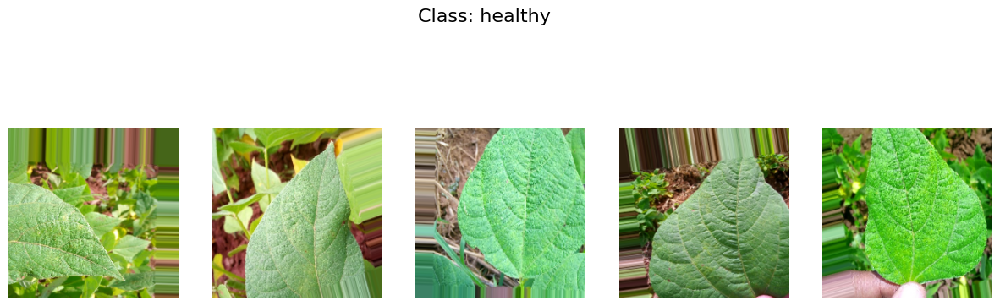

In [13]:
import matplotlib.pyplot as plt

for class_name, class_idx in train_generator.class_indices.items():
    fig, axes = plt.subplots(1, 5, figsize=(15, 5))
    fig.suptitle(f"Class: {class_name}", fontsize=16)
    count = 0

    for x, y in train_generator:
        for img, label in zip(x, y):
            if label[class_idx] == 1:
                axes[count].imshow(img)
                axes[count].axis('off')
                count += 1
                if count == 5:
                    break
        if count == 5:
            break

    plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


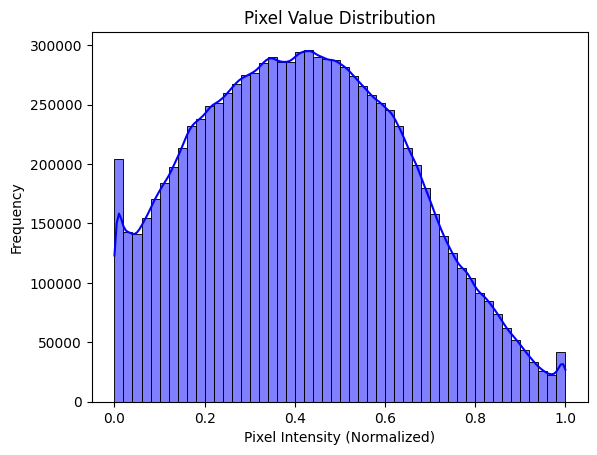

In [ ]:


pixel_values = []

for x, y in train_generator:
    pixel_values.extend(x.flatten())
    if len(pixel_values) > 100000:
        break

sns.histplot(pixel_values, bins=50, kde=True, color='blue')
plt.title("Pixel Value Distribution")
plt.xlabel("Pixel Intensity (Normalized)")
plt.ylabel("Frequency")
plt.show()


In [10]:
with tf.device('/gpu:0'):

    no_scale_train_datagen = ImageDataGenerator(
        #rescale=1./255,
        rotation_range=30,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True
    )

    no_scale_validation_datagen = ImageDataGenerator()

    no_scale_test_datagen = ImageDataGenerator()

    no_scale_train_generator = no_scale_train_datagen.flow_from_directory(
        train_dir,
        target_size=(224, 224),
        batch_size=32,
        shuffle=True,
        class_mode='categorical'
    )

    no_scale_validation_generator = no_scale_validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(224, 224),
        batch_size=32,
        class_mode='categorical'
    )

    no_scale_test_generator = no_scale_test_datagen.flow_from_directory(
        test_dir,
        target_size=(224, 224),
        batch_size=32,
        class_mode='categorical'
    )

    base_model = NASNetMobile(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = False


Found 1034 images belonging to 3 classes.
Found 133 images belonging to 3 classes.
Found 128 images belonging to 3 classes.


In [11]:
def create_optimizer(optimizer, lr=3e-4):
    if optimizer == 'adam':
        return Adam(learning_rate=lr)
    elif optimizer == 'nadam':
        return Nadam(learning_rate=lr)
    elif optimizer == 'rmsprop':
        return RMSprop(learning_rate=lr)
    else:
        raise ValueError("Unsupported optimizer")

In [12]:
def train_model(base_model, dense_layers, dense_layers_dropout, train_generator, validation_generator,
                optimizer, loss, metrics, freezed_epochs, fine_tune_epochs, learning_rate=3e-4):
    base_model.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    for i in range(len(dense_layers)) :
        x = Dense(dense_layers[i], activation='relu')(x)
        # x = BatchNormalization()(x)
        x = Dropout(dense_layers_dropout[i])(x)

    num_classes = train_generator.num_classes
    output = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=output)

    model.compile(
        optimizer=create_optimizer(optimizer, learning_rate),
        loss=loss,
        metrics=metrics
    )

    early_stopping_freeze = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    history = model.fit(
        train_generator,
        validation_data=validation_generator,
        epochs=freezed_epochs,
        callbacks=[early_stopping_freeze]
    )

    base_model.trainable = True

    model.compile(
        optimizer=create_optimizer(optimizer, learning_rate),
        loss=loss,
        metrics=metrics
    )

    early_stopping_fine = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    history_fine = model.fit(
        train_generator,
        validation_data=validation_generator,
        epochs=fine_tune_epochs,
        callbacks=[early_stopping_fine]
    )

    return model, history, history_fine

In [13]:
def train_model2(base_model, dense_layers, dense_layers_dropout, train_generator, validation_generator,
                optimizer, loss, metrics, freezed_epochs, fine_tune_epochs, learning_rate=3e-4):
    base_model.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    for i in range(len(dense_layers)) :
        x = Dense(dense_layers[i], activation='relu')(x)
        # x = BatchNormalization()(x)
        x = Dropout(dense_layers_dropout[i])(x)

    num_classes = train_generator.num_classes
    output = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=output)

    model.compile(
        optimizer=create_optimizer(optimizer, learning_rate),
        loss=loss,
        metrics=metrics
    )

    early_stopping_freeze = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    history = model.fit(
        train_generator,
        validation_data=validation_generator,
        epochs=freezed_epochs,
        callbacks=[early_stopping_freeze]
    )

    base_model.trainable = True
    for layer in base_model.layers[:-(len(base_model.layers)//10)]:
        layer.trainable = False

    model.compile(
        optimizer=create_optimizer(optimizer, learning_rate),
        loss=loss,
        metrics=metrics
    )

    early_stopping_fine = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    history_fine = model.fit(
        train_generator,
        validation_data=validation_generator,
        epochs=fine_tune_epochs,
        callbacks=[early_stopping_fine]
    )

    return model, history, history_fine

In [ ]:
with tf.device('/gpu:0'):
    nasNet_base_model = NASNetMobile(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    nasNet_model, nasNet_history, nasNet_history_fine = train_model(base_model=nasNet_base_model,
                dense_layers=[256], dense_layers_dropout=[0.5],
                train_generator=train_generator, validation_generator=validation_generator,
                optimizer='adam', loss='categorical_crossentropy',
                metrics=['accuracy', Precision(), Recall()], freezed_epochs=100, fine_tune_epochs=100)

Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1732476421.444952      66 service.cc:145] XLA service 0x7a8078005490 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732476421.445027      66 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


 2/17 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.2500 - loss: 1.3379 - precision: 0.2716 - recall: 0.1523  

I0000 00:00:1732476435.247254      66 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


17/17 ━━━━━━━━━━━━━━━━━━━━ 74s 2s/step - accuracy: 0.4172 - loss: 1.1294 - precision: 0.4608 - recall: 0.2964 - val_accuracy: 0.6767 - val_loss: 0.7482 - val_precision: 0.7766 - val_recall: 0.5489
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 15s 584ms/step - accuracy: 0.6095 - loss: 0.8299 - precision: 0.6820 - recall: 0.5232 - val_accuracy: 0.7444 - val_loss: 0.6466 - val_precision: 0.8269 - val_recall: 0.6466
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 15s 581ms/step - accuracy: 0.6748 - loss: 0.7436 - precision: 0.7245 - recall: 0.6042 - val_accuracy: 0.7744 - val_loss: 0.6105 - val_precision: 0.8411 - val_recall: 0.6767
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 16s 610ms/step - accuracy: 0.6948 - loss: 0.6909 - precision: 0.7423 - recall: 0.6094 - val_accuracy: 0.7519 - val_loss: 0.5786 - val_precision: 0.8407 - val_recall: 0.7143
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 15s 574ms/step - accuracy: 0.7201 - loss: 0.6365 - precision: 0.7860 - recall: 0.6747 - val_accuracy: 0.7895 - val_loss: 0.5541 

In [ ]:
test_loss, test_accuracy, test_precision, test_recall = nasNet_model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy * 100:.2f}% \nTest recall: {test_recall * 100:.2f}% \nTest precision: {test_precision * 100:.2f}% \n ")

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 233ms/step - accuracy: 0.9333 - loss: 0.2327 - precision: 0.9381 - recall: 0.9333
Test Accuracy: 91.41% 
Test recall: 91.41% 
Test precision: 92.13% 
 


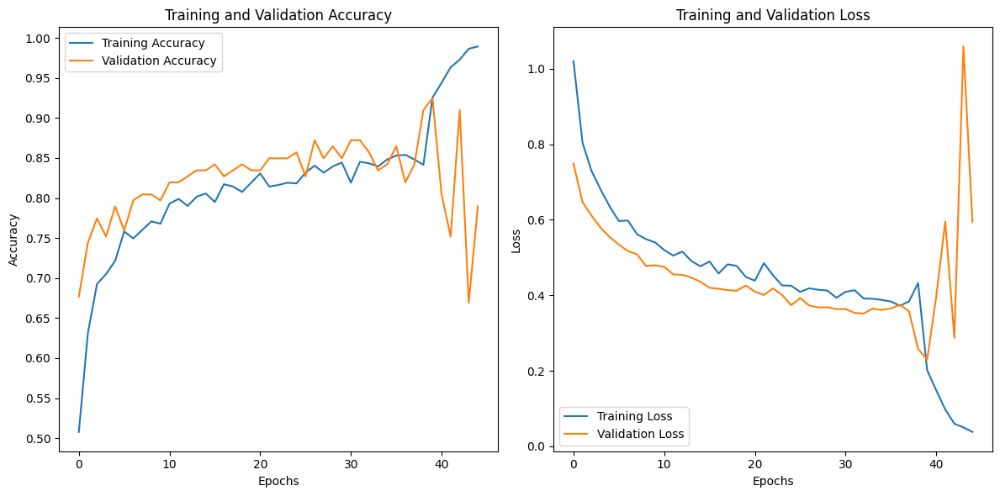

In [ ]:
plot_training_history(nasNet_history, nasNet_history_fine)

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step


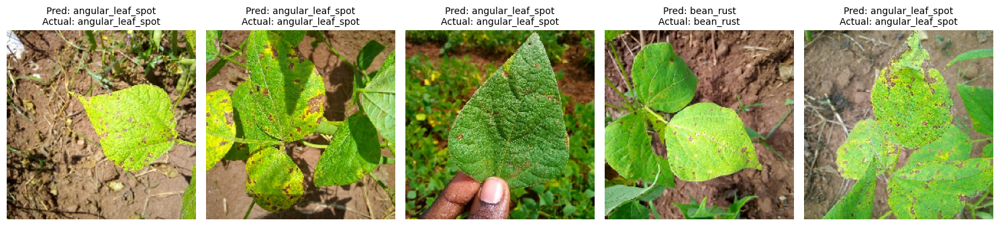

In [ ]:
test_model_and_plot(
    model=nasNet_model,
    test_generator=test_generator,
    class_indices=test_generator.class_indices,
    num_samples=5
)

In [ ]:
with tf.device('/gpu:0'):
    nasNet_base_model = NASNetMobile(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    nadam_nasNet_model, nadam_nasNet_history, nadam_nasNet_history_fine = train_model(base_model=
                                                                                      nasNet_base_model,
                dense_layers=[256], dense_layers_dropout=[0.5],
                train_generator=train_generator, validation_generator=validation_generator,
                optimizer='nadam', loss='categorical_crossentropy',
                metrics=['accuracy', Precision(), Recall()], freezed_epochs=100, fine_tune_epochs=100)

Epoch 1/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 68s 2s/step - accuracy: 0.4048 - loss: 1.1660 - precision_1: 0.4097 - recall_1: 0.2693 - val_accuracy: 0.6316 - val_loss: 0.8638 - val_precision_1: 0.7108 - val_recall_1: 0.4436
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 15s 562ms/step - accuracy: 0.6291 - loss: 0.8559 - precision_1: 0.6928 - recall_1: 0.5399 - val_accuracy: 0.7519 - val_loss: 0.7030 - val_precision_1: 0.7830 - val_recall_1: 0.6241
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 15s 562ms/step - accuracy: 0.7051 - loss: 0.7063 - precision_1: 0.7452 - recall_1: 0.6227 - val_accuracy: 0.7669 - val_loss: 0.6669 - val_precision_1: 0.8224 - val_recall_1: 0.6617
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 15s 526ms/step - accuracy: 0.7112 - loss: 0.6777 - precision_1: 0.7781 - recall_1: 0.6419 - val_accuracy: 0.7594 - val_loss: 0.6096 - val_precision_1: 0.7881 - val_recall_1: 0.6992
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 15s 562ms/step - accuracy: 0.7083 - loss: 0.6425 - precision_1: 0.7524 - recall_1: 0

In [ ]:
nadam_nasNet_test_loss, nadam_nasNet_test_accuracy, nadam_nasNet_test_precision, nadam_nasNet_test_recall = nadam_nasNet_model.evaluate(test_generator)
print(f"Test Accuracy: {nadam_nasNet_test_accuracy * 100:.2f}% \nTest recall: {nadam_nasNet_test_recall * 100:.2f}% \nTest precision: {nadam_nasNet_test_precision * 100:.2f}% \n ")

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.8823 - loss: 0.2892 - precision_1: 0.8983 - recall_1: 0.8823
Test Accuracy: 86.72% 
Test recall: 86.72% 
Test precision: 88.10% 
 


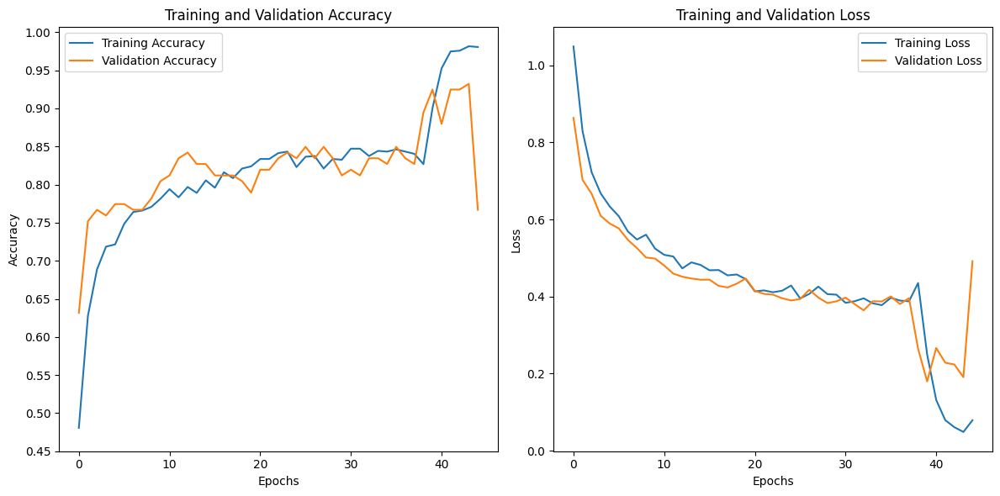

In [ ]:
plot_training_history(nadam_nasNet_history, nadam_nasNet_history_fine)

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


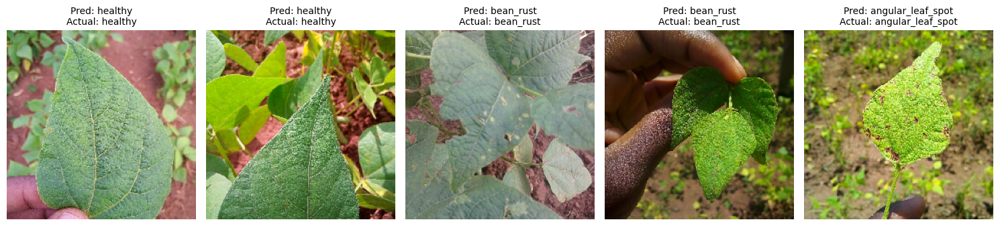

In [ ]:
test_model_and_plot(
    model=nadam_nasNet_model,
    test_generator=test_generator,
    class_indices=test_generator.class_indices,
    num_samples=5
)

In [ ]:
with tf.device('/gpu:0'):
    nasNet_base_model = NASNetMobile(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    rmsprop_nasNet_model, rmsprop_nasNet_history, rmsprop_nasNet_history_fine = train_model(base_model=
                                                                                      nasNet_base_model,
                dense_layers=[256], dense_layers_dropout=[0.5],
                train_generator=train_generator, validation_generator=validation_generator,
                optimizer='rmsprop', loss='categorical_crossentropy',
                metrics=['accuracy', Precision(), Recall()], freezed_epochs=100, fine_tune_epochs=100)

Epoch 1/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 69s 2s/step - accuracy: 0.4489 - loss: 1.1913 - precision_2: 0.4643 - recall_2: 0.3449 - val_accuracy: 0.6466 - val_loss: 0.8400 - val_precision_2: 0.7400 - val_recall_2: 0.5564
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 15s 570ms/step - accuracy: 0.5969 - loss: 0.8631 - precision_2: 0.6692 - recall_2: 0.5204 - val_accuracy: 0.7444 - val_loss: 0.7180 - val_precision_2: 0.7692 - val_recall_2: 0.6767
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 15s 511ms/step - accuracy: 0.6868 - loss: 0.7157 - precision_2: 0.7357 - recall_2: 0.6089 - val_accuracy: 0.7669 - val_loss: 0.6685 - val_precision_2: 0.7966 - val_recall_2: 0.7068
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 15s 531ms/step - accuracy: 0.7065 - loss: 0.6770 - precision_2: 0.7383 - recall_2: 0.6207 - val_accuracy: 0.7594 - val_loss: 0.5958 - val_precision_2: 0.8036 - val_recall_2: 0.6767
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 15s 548ms/step - accuracy: 0.7397 - loss: 0.6245 - precision_2: 0.7776 - recall_2: 0

In [ ]:
rmsprop_nasNet_test_loss, rmsprop_nasNet_test_accuracy, rmsprop_nasNet_test_precision, rmsprop_nasNet_test_recall = rmsprop_nasNet_model.evaluate(test_generator)
print(f"Test Accuracy: {rmsprop_nasNet_test_accuracy * 100:.2f}% \nTest recall: {rmsprop_nasNet_test_recall * 100:.2f}% \nTest precision: {rmsprop_nasNet_test_precision * 100:.2f}% \n ")

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - accuracy: 0.8740 - loss: 0.3424 - precision_2: 0.8740 - recall_2: 0.8740
Test Accuracy: 89.84% 
Test recall: 89.84% 
Test precision: 89.84% 
 


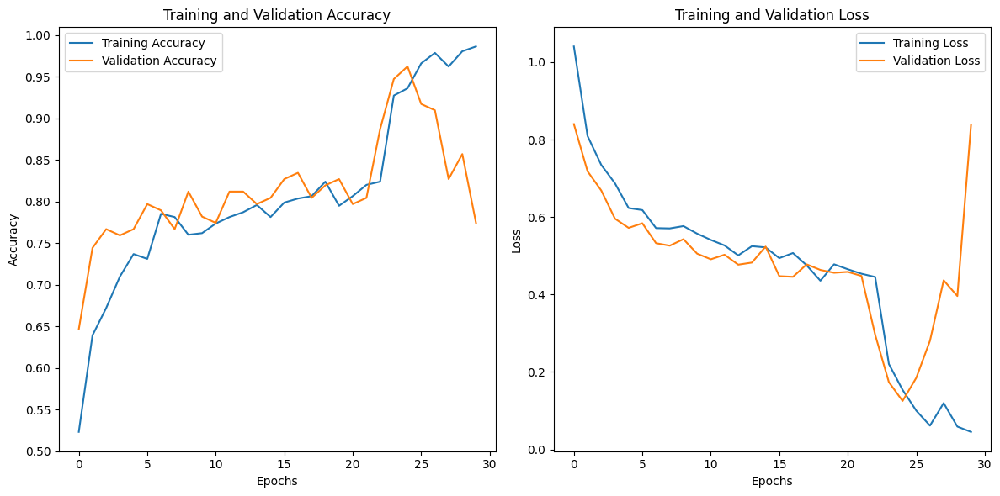

In [ ]:
plot_training_history(rmsprop_nasNet_history, rmsprop_nasNet_history_fine)

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


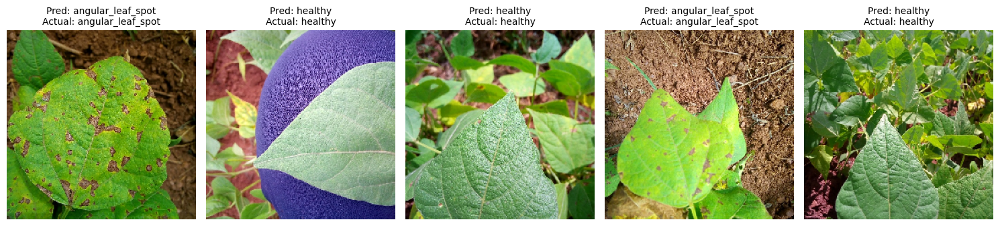

In [ ]:
test_model_and_plot(
    model=rmsprop_nasNet_model,
    test_generator=test_generator,
    class_indices=test_generator.class_indices,
    num_samples=5
)

In [ ]:
with tf.device('/gpu:0'):
    EfficientNet_base_model = EfficientNetB6(weights='imagenet', include_top=False,
                                             input_shape=(224, 224, 3))
    rmsprop_EfficientNet_model, rmsprop_EfficientNet_history, rmsprop_EfficientNet_history_fine = train_model(base_model=
                                                                                      EfficientNet_base_model,
                dense_layers=[256], dense_layers_dropout=[0.5],
                train_generator=no_scale_train_generator, validation_generator=no_scale_validation_generator,
                optimizer='rmsprop', loss='categorical_crossentropy',
                metrics=['accuracy', Precision(), Recall()], freezed_epochs=100, fine_tune_epochs=100)


165234480/165234480 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step
Epoch 1/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 211s 6s/step - accuracy: 0.4986 - loss: 0.9541 - precision_3: 0.6314 - recall_3: 0.2946 - val_accuracy: 0.7068 - val_loss: 0.7294 - val_precision_3: 0.7935 - val_recall_3: 0.5489
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 16s 641ms/step - accuracy: 0.7706 - loss: 0.6432 - precision_3: 0.8201 - recall_3: 0.6574 - val_accuracy: 0.7820 - val_loss: 0.5924 - val_precision_3: 0.8421 - val_recall_3: 0.7218
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 16s 623ms/step - accuracy: 0.7608 - loss: 0.5859 - precision_3: 0.8072 - recall_3: 0.6814 - val_accuracy: 0.7820 - val_loss: 0.5621 - val_precision_3: 0.8291 - val_recall_3: 0.7293
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 16s 570ms/step - accuracy: 0.8019 - loss: 0.5103 - precision_3: 0.8364 - recall_3: 0.7529 - val_accuracy: 0.8346 - val_loss: 0.4896 - val_precision_3: 0.8430 - val_recall_3: 0.7669
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 16s 577ms/step - accuracy: 0.8

In [ ]:
rmsprop_EfficientNet_test_loss, rmsprop_EfficientNet_test_accuracy, rmsprop_EfficientNet_test_precision, rmsprop_EfficientNet_test_recall = rmsprop_EfficientNet_model.evaluate(no_scale_test_generator)
print(f"Test Accuracy: {rmsprop_EfficientNet_test_accuracy * 100:.2f}% \nTest recall: {rmsprop_EfficientNet_test_recall * 100:.2f}% \nTest precision: {rmsprop_EfficientNet_test_precision * 100:.2f}% \n ")

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - accuracy: 0.9583 - loss: 0.2984 - precision_3: 0.9583 - recall_3: 0.9583
Test Accuracy: 95.31% 
Test recall: 95.31% 
Test precision: 95.31% 
 


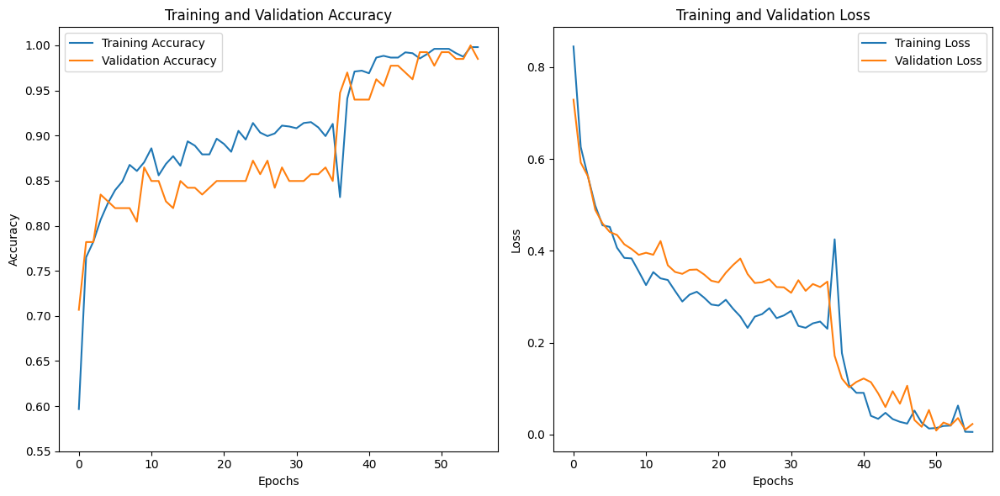

In [ ]:
plot_training_history(rmsprop_EfficientNet_history, rmsprop_EfficientNet_history_fine)

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step


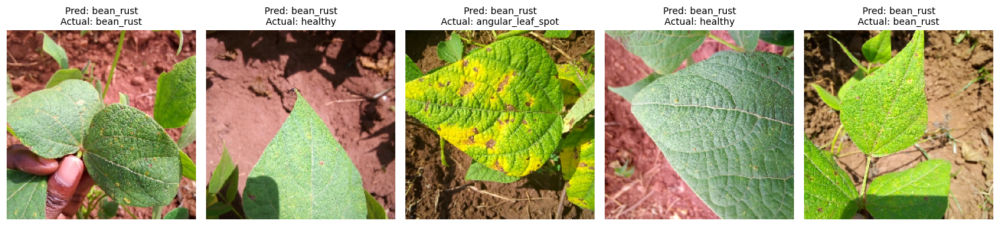

In [ ]:
test_model_and_plot(
    model=rmsprop_EfficientNet_model,
    test_generator=test_generator,
    class_indices=test_generator.class_indices,
    num_samples=5
)

In [13]:
with tf.device('/gpu:0'):
    EfficientNet_base_model = EfficientNetB6(weights='imagenet', include_top=False,
                                             input_shape=(224, 224, 3))
    nadam_EfficientNet_model, nadam_EfficientNet_history, nadam_EfficientNet_history_fine = train_model(base_model=
                                                                                      EfficientNet_base_model,
                dense_layers=[256], dense_layers_dropout=[0.5],
                train_generator=no_scale_train_generator, validation_generator=no_scale_validation_generator,
                optimizer='nadam', loss='categorical_crossentropy',
                metrics=['accuracy', Precision(), Recall()], freezed_epochs=100, fine_tune_epochs=100)


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


33/33 ━━━━━━━━━━━━━━━━━━━━ 146s 2s/step - accuracy: 0.5147 - loss: 0.9973 - precision: 0.6471 - recall: 0.2102 - val_accuracy: 0.7143 - val_loss: 0.6899 - val_precision: 0.7850 - val_recall: 0.6316
Epoch 2/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 41s 458ms/step - accuracy: 0.7455 - loss: 0.6334 - precision: 0.7941 - recall: 0.6636 - val_accuracy: 0.7744 - val_loss: 0.5206 - val_precision: 0.8376 - val_recall: 0.7368
Epoch 3/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 20s 451ms/step - accuracy: 0.8260 - loss: 0.4728 - precision: 0.8594 - recall: 0.7639 - val_accuracy: 0.7970 - val_loss: 0.4561 - val_precision: 0.8430 - val_recall: 0.7669
Epoch 4/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 18s 455ms/step - accuracy: 0.8103 - loss: 0.4562 - precision: 0.8462 - recall: 0.7857 - val_accuracy: 0.8120 - val_loss: 0.4201 - val_precision: 0.8480 - val_recall: 0.7970
Epoch 5/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 19s 435ms/step - accuracy: 0.8564 - loss: 0.3920 - precision: 0.8814 - recall: 0.8287 - val_accuracy: 0.8271 - val_loss: 0.4029

In [14]:
nadam_EfficientNet_test_loss, nadam_EfficientNet_test_accuracy, nadam_EfficientNet_test_precision, nadam_EfficientNet_test_recall = nadam_EfficientNet_model.evaluate(no_scale_test_generator)
print(f"Test Accuracy: {nadam_EfficientNet_test_accuracy * 100:.2f}% \nTest recall: {nadam_EfficientNet_test_recall * 100:.2f}% \nTest precision: {nadam_EfficientNet_test_precision * 100:.2f}% \n ")

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - accuracy: 0.9417 - loss: 0.2150 - precision: 0.9417 - recall: 0.9417
Test Accuracy: 92.97% 
Test recall: 92.97% 
Test precision: 92.97% 
 


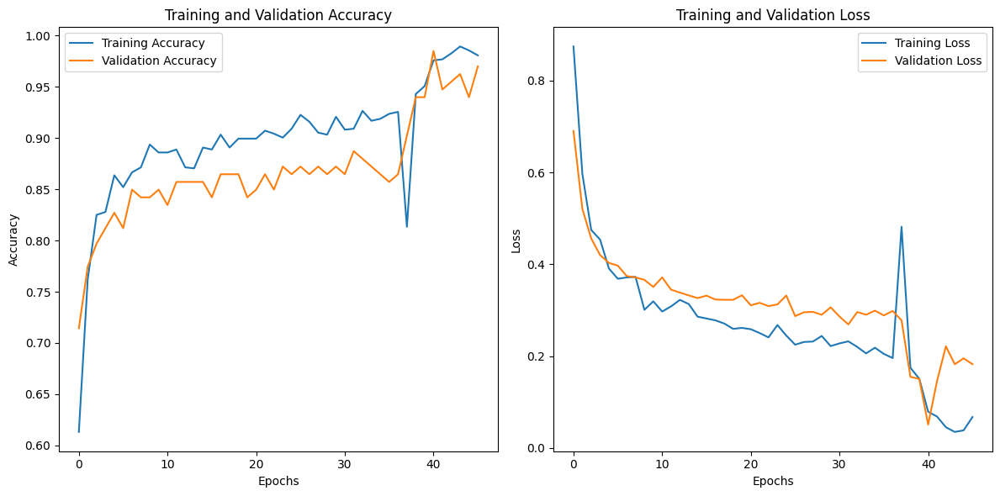

In [15]:
plot_training_history(nadam_EfficientNet_history, nadam_EfficientNet_history_fine)

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step


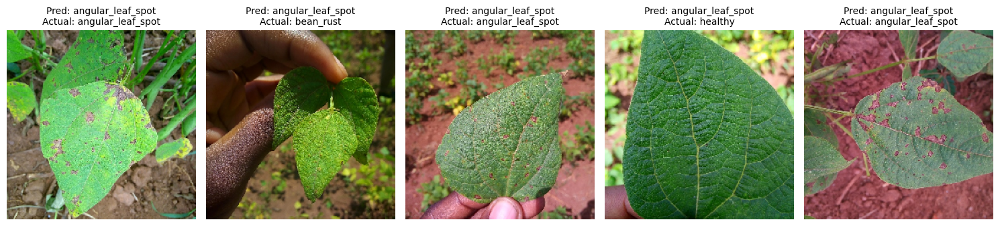

In [16]:
test_model_and_plot(
    model=nadam_EfficientNet_model,
    test_generator=test_generator,
    class_indices=test_generator.class_indices,
    num_samples=5
)

In [14]:
with tf.device('/gpu:0'):
    EfficientNet_base_model = EfficientNetB6(weights='imagenet', include_top=False,
                                             input_shape=(224, 224, 3))
    adam_EfficientNet_model, adam_EfficientNet_history, adam_EfficientNet_history_fine = train_model(base_model=
                                                                                      EfficientNet_base_model,
                dense_layers=[256], dense_layers_dropout=[0.5],
                train_generator=no_scale_train_generator, validation_generator=no_scale_validation_generator,
                optimizer='adam', loss='categorical_crossentropy',
                metrics=['accuracy', Precision(), Recall()], freezed_epochs=100, fine_tune_epochs=100)


165234480/165234480 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


33/33 ━━━━━━━━━━━━━━━━━━━━ 137s 2s/step - accuracy: 0.5462 - loss: 0.9400 - precision: 0.6665 - recall: 0.2734 - val_accuracy: 0.7293 - val_loss: 0.6593 - val_precision: 0.7982 - val_recall: 0.6541
Epoch 2/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 18s 435ms/step - accuracy: 0.7445 - loss: 0.5989 - precision: 0.8080 - recall: 0.6840 - val_accuracy: 0.7895 - val_loss: 0.5183 - val_precision: 0.8130 - val_recall: 0.7519
Epoch 3/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 18s 452ms/step - accuracy: 0.8146 - loss: 0.4718 - precision: 0.8406 - recall: 0.7709 - val_accuracy: 0.8271 - val_loss: 0.4849 - val_precision: 0.8387 - val_recall: 0.7820
Epoch 4/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 20s 435ms/step - accuracy: 0.8305 - loss: 0.4415 - precision: 0.8520 - recall: 0.8081 - val_accuracy: 0.8045 - val_loss: 0.4705 - val_precision: 0.8333 - val_recall: 0.7519
Epoch 5/100
33/33 ━━━━━━━━━━━━━━━━━━━━ 20s 438ms/step - accuracy: 0.8223 - loss: 0.4487 - precision: 0.8528 - recall: 0.7978 - val_accuracy: 0.8045 - val_loss: 0.4086

In [15]:
adam_EfficientNet_test_loss, adam_EfficientNet_test_accuracy, adam_EfficientNet_test_precision, adam_EfficientNet_test_recall = adam_EfficientNet_model.evaluate(no_scale_test_generator)
print(f"Test Accuracy: {adam_EfficientNet_test_accuracy * 100:.2f}% \nTest recall: {adam_EfficientNet_test_recall * 100:.2f}% \nTest precision: {adam_EfficientNet_test_precision * 100:.2f}% \n ")

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 177ms/step - accuracy: 0.9573 - loss: 0.1690 - precision: 0.9622 - recall: 0.9573
Test Accuracy: 92.97% 
Test recall: 92.97% 
Test precision: 93.70% 
 


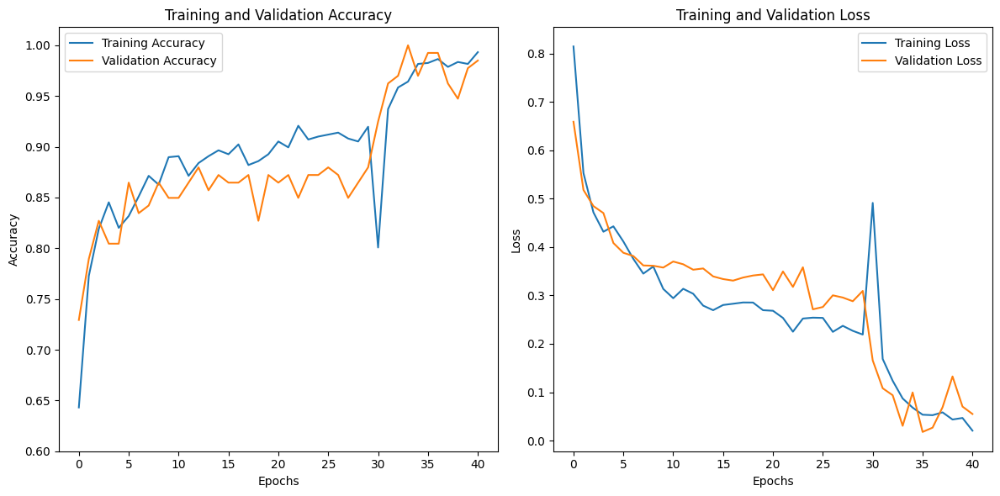

In [16]:
plot_training_history(adam_EfficientNet_history, adam_EfficientNet_history_fine)

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step


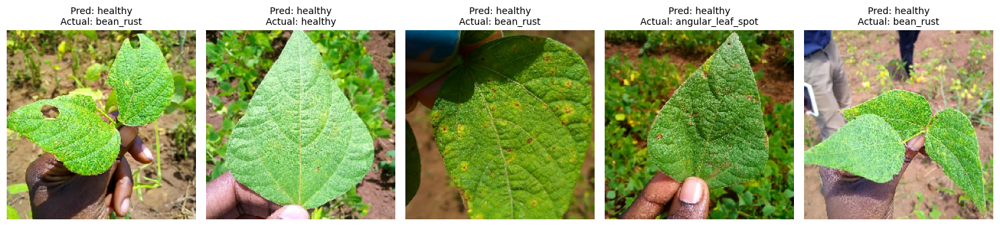

In [17]:
test_model_and_plot(
    model=adam_EfficientNet_model,
    test_generator=test_generator,
    class_indices=test_generator.class_indices,
    num_samples=5
)

In [18]:
with tf.device('/gpu:0'):
    MobileNetV2_base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3), alpha=1.4)
    adam_MobileNetV2_model, adam_MobileNetV2_history, adam_MobileNetV2_history_fine = train_model2(base_model=
                                                                                      MobileNetV2_base_model,
                dense_layers=[256], dense_layers_dropout=[0.5],
                train_generator=train_generator, validation_generator=validation_generator,
                optimizer='adam', loss='categorical_crossentropy',
                metrics=['accuracy', Precision(), Recall()], freezed_epochs=100, fine_tune_epochs=100)


17831080/17831080 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.4824 - loss: 1.1200 - precision_1: 0.5139 - recall_1: 0.3938 - val_accuracy: 0.8045 - val_loss: 0.5191 - val_precision_1: 0.8596 - val_recall_1: 0.7368
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 17s 489ms/step - accuracy: 0.7414 - loss: 0.5844 - precision_1: 0.7701 - recall_1: 0.7123 - val_accuracy: 0.8647 - val_loss: 0.4260 - val_precision_1: 0.8740 - val_recall_1: 0.8346
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 21s 571ms/step - accuracy: 0.7983 - loss: 0.5054 - precision_1: 0.8090 - recall_1: 0.7574 - val_accuracy: 0.8722 - val_loss: 0.4118 - val_precision_1: 0.8915 - val_recall_1: 0.8647
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 15s 546ms/step - accuracy: 0.8386 - loss: 0.4122 - precision_1: 0.8557 - recall_1: 0.8144 - val_accuracy: 0.8947 - val_loss: 0.3424 - val_precision_1: 0.8939 - val_recall_1: 0.8872
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 20s 604ms/step - accuracy: 0.8497

In [19]:
adam_MobileNetV2_test_loss, adam_MobileNetV2_test_accuracy, adam_MobileNetV2_test_precision, adam_MobileNetV2_test_recall = adam_MobileNetV2_model.evaluate(test_generator)
print(f"Test Accuracy: {adam_MobileNetV2_test_accuracy * 100:.2f}% \nTest recall: {adam_MobileNetV2_test_recall * 100:.2f}% \nTest precision: {adam_MobileNetV2_test_precision * 100:.2f}% \n ")

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - accuracy: 0.9438 - loss: 0.2326 - precision_1: 0.9438 - recall_1: 0.9438
Test Accuracy: 93.75% 
Test recall: 93.75% 
Test precision: 93.75% 
 


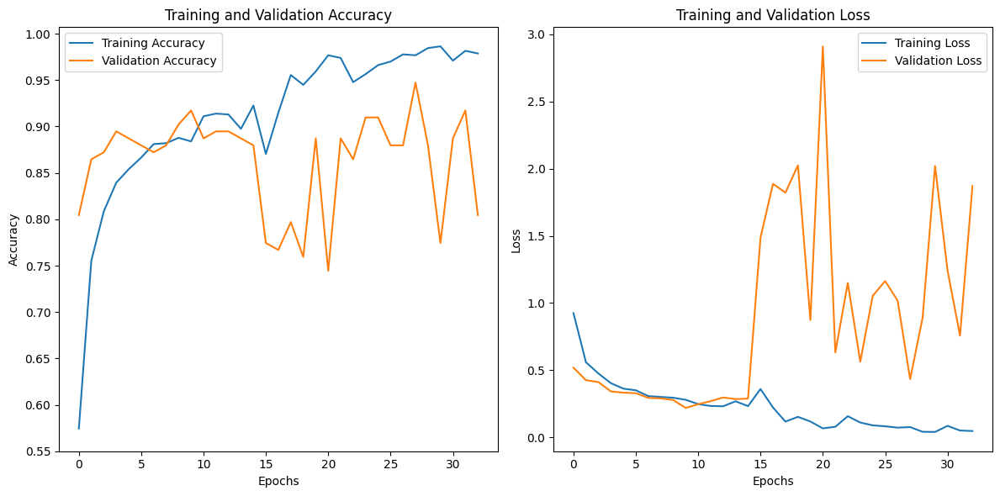

In [20]:
plot_training_history(adam_MobileNetV2_history, adam_MobileNetV2_history_fine)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


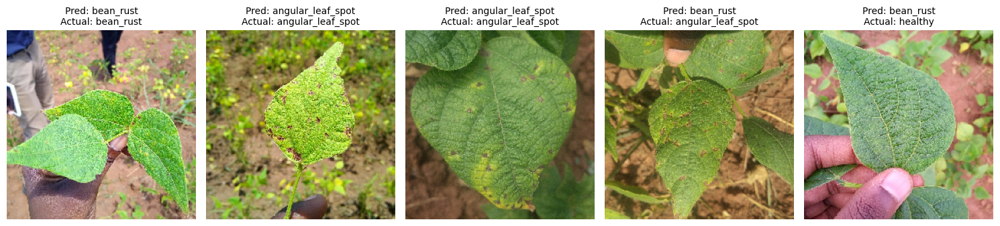

In [21]:
test_model_and_plot(
    model=adam_MobileNetV2_model,
    test_generator=test_generator,
    class_indices=test_generator.class_indices,
    num_samples=5
)

In [22]:
with tf.device('/gpu:0'):
    MobileNetV2_base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3), alpha=1.4)
    nadam_MobileNetV2_model, nadam_MobileNetV2_history, nadam_MobileNetV2_history_fine = train_model2(base_model=
                                                                                      MobileNetV2_base_model,
                dense_layers=[256], dense_layers_dropout=[0.5],
                train_generator=train_generator, validation_generator=validation_generator,
                optimizer='nadam', loss='categorical_crossentropy',
                metrics=['accuracy', Precision(), Recall()], freezed_epochs=100, fine_tune_epochs=100)


Epoch 1/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - accuracy: 0.4366 - loss: 1.1973 - precision_2: 0.4551 - recall_2: 0.3401 - val_accuracy: 0.7068 - val_loss: 0.6684 - val_precision_2: 0.7459 - val_recall_2: 0.6842
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 29s 555ms/step - accuracy: 0.7275 - loss: 0.6251 - precision_2: 0.7536 - recall_2: 0.6799 - val_accuracy: 0.8120 - val_loss: 0.4864 - val_precision_2: 0.8346 - val_recall_2: 0.7970
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 20s 558ms/step - accuracy: 0.8149 - loss: 0.4570 - precision_2: 0.8408 - recall_2: 0.7924 - val_accuracy: 0.8195 - val_loss: 0.4191 - val_precision_2: 0.8425 - val_recall_2: 0.8045
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 15s 497ms/step - accuracy: 0.8381 - loss: 0.4201 - precision_2: 0.8618 - recall_2: 0.8131 - val_accuracy: 0.8571 - val_loss: 0.3460 - val_precision_2: 0.8682 - val_recall_2: 0.8421
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 20s 556ms/step - accuracy: 0.8630 - loss: 0.3546 - precision_2: 0.8741 - recall_2: 0

In [23]:
nadam_MobileNetV2_test_loss, nadam_MobileNetV2_test_accuracy, nadam_MobileNetV2_test_precision, nadam_MobileNetV2_test_recall = nadam_MobileNetV2_model.evaluate(test_generator)
print(f"Test Accuracy: {nadam_MobileNetV2_test_accuracy * 100:.2f}% \nTest recall: {nadam_MobileNetV2_test_recall * 100:.2f}% \nTest precision: {nadam_MobileNetV2_test_precision * 100:.2f}% \n ")

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - accuracy: 0.9542 - loss: 0.2735 - precision_2: 0.9542 - recall_2: 0.9542
Test Accuracy: 94.53% 
Test recall: 94.53% 
Test precision: 94.53% 
 


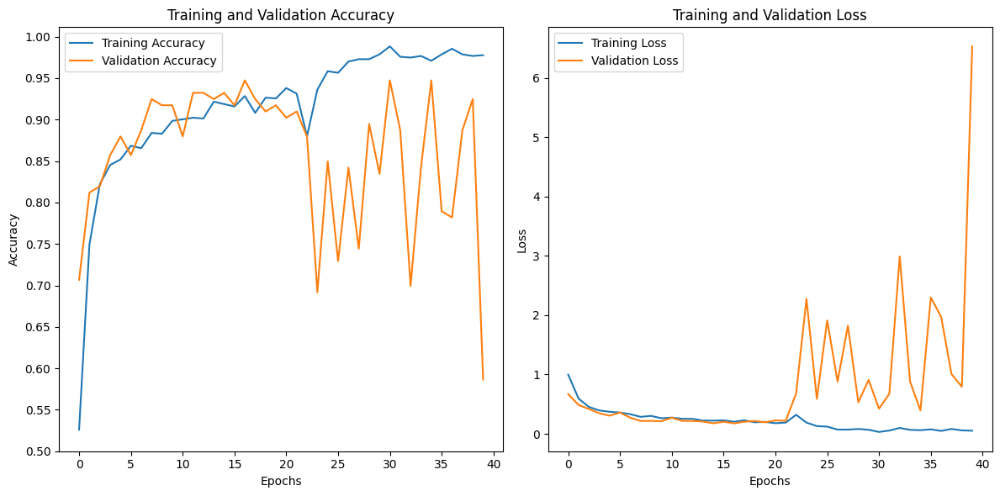

In [24]:
plot_training_history(nadam_MobileNetV2_history, nadam_MobileNetV2_history_fine)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


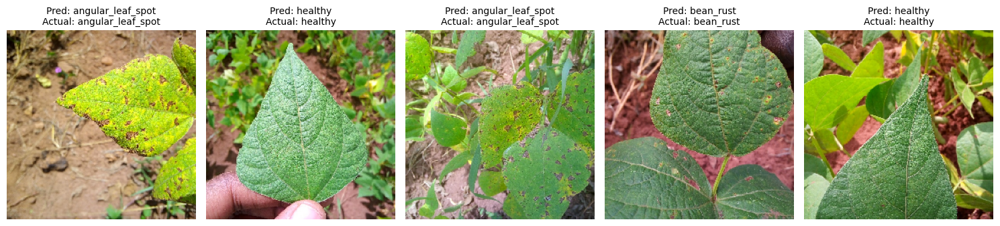

In [25]:
test_model_and_plot(
    model=nadam_MobileNetV2_model,
    test_generator=test_generator,
    class_indices=test_generator.class_indices,
    num_samples=5
)

In [37]:
with tf.device('/gpu:0'):
    MobileNetV2_base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3), alpha=1.4)
    rmsprop_MobileNetV2_model, rmsprop_MobileNetV2_history, rmsprop_MobileNetV2_history_fine = train_model2(base_model=
                                                                                      MobileNetV2_base_model,
                dense_layers=[128], dense_layers_dropout=[0.5],
                train_generator=train_generator, validation_generator=validation_generator,
                optimizer='rmsprop', loss='categorical_crossentropy',
                metrics=['accuracy', Precision(), Recall()], freezed_epochs=100, fine_tune_epochs=0,learning_rate=3e-4)


Epoch 1/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.4813 - loss: 1.1033 - precision_5: 0.4987 - recall_5: 0.3857 - val_accuracy: 0.7820 - val_loss: 0.6291 - val_precision_5: 0.8400 - val_recall_5: 0.6316
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 17s 640ms/step - accuracy: 0.7114 - loss: 0.6719 - precision_5: 0.7548 - recall_5: 0.6402 - val_accuracy: 0.8271 - val_loss: 0.4894 - val_precision_5: 0.8860 - val_recall_5: 0.7594
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 23s 627ms/step - accuracy: 0.7656 - loss: 0.5603 - precision_5: 0.7961 - recall_5: 0.7109 - val_accuracy: 0.8647 - val_loss: 0.4656 - val_precision_5: 0.8720 - val_recall_5: 0.8195
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 16s 582ms/step - accuracy: 0.7916 - loss: 0.4904 - precision_5: 0.8102 - recall_5: 0.7486 - val_accuracy: 0.8797 - val_loss: 0.3738 - val_precision_5: 0.8976 - val_recall_5: 0.8571
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 21s 553ms/step - accuracy: 0.8120 - loss: 0.4612 - precision_5: 0.8311 - recall_5: 0

In [34]:
rmsprop_MobileNetV2_test_loss, rmsprop_MobileNetV2_test_accuracy, rmsprop_MobileNetV2_test_precision, rmsprop_MobileNetV2_test_recall = rmsprop_MobileNetV2_model.evaluate(test_generator)
print(f"Test Accuracy: {rmsprop_MobileNetV2_test_accuracy * 100:.2f}% \nTest recall: {rmsprop_MobileNetV2_test_recall * 100:.2f}% \nTest precision: {rmsprop_MobileNetV2_test_precision * 100:.2f}% \n ")

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 135ms/step - accuracy: 0.8938 - loss: 0.4364 - precision_4: 0.8985 - recall_4: 0.8938
Test Accuracy: 89.06% 
Test recall: 89.06% 
Test precision: 89.76% 
 


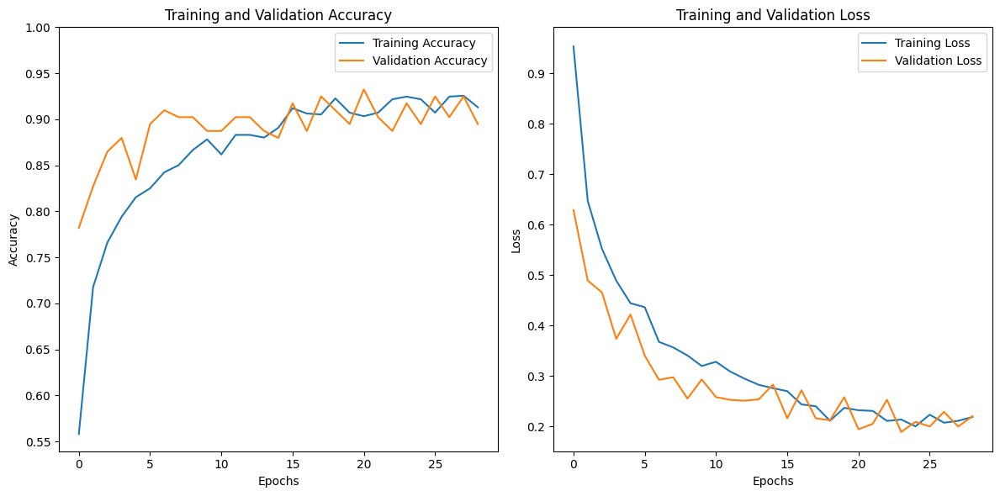

In [38]:
plot_training_history2(rmsprop_MobileNetV2_history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


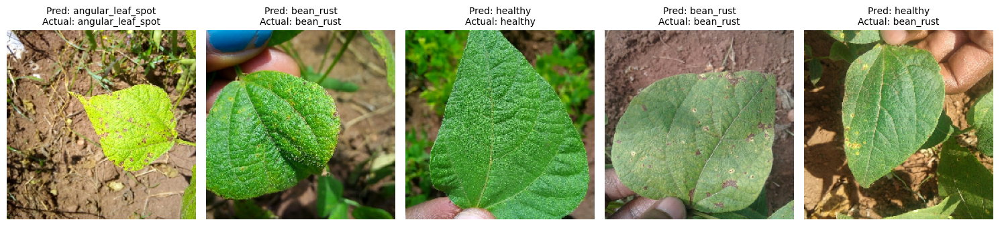

In [39]:
test_model_and_plot(
    model=rmsprop_MobileNetV2_model,
    test_generator=test_generator,
    class_indices=test_generator.class_indices,
    num_samples=5
)